In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import os
import sys

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

In [4]:
import scipy.stats as stats
import scipy

In [5]:
from scAAnet.tools import load_df_from_npz, save_df_to_npz, plotRankedGeneScore, plotDensity, plotDensityGamma, geneScore

In [6]:
from sklearn.metrics import adjusted_mutual_info_score, adjusted_rand_score, silhouette_score

# Load lung data

In [ ]:
# Original data can be downloaded from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE136831

In [5]:
# adata = sc.read_h5ad("../data/lung/manuscriptVersion.Scanpy.05122021.h5ad")

In [27]:
# adata

AnnData object with n_obs × n_vars = 312928 × 45947
    obs: 'nGene', 'nUMI', 'orig.ident', 'library.ident', 'disease.ident', 'subject.ident', 'percent.mito', 'cell.type.desc.ident', 'cell.type.ident', 'cell.cat.ident', 'Manuscript_Identity', 'CellBarcode_Identity'
    var: 'Ensembl_GeneID'

In [6]:
# adata.obs['Manuscript_Identity'].value_counts()

Macrophage             108994
Macrophage_Alveolar     74558
T_Cytotoxic             16396
T                       16102
cMonocyte               15476
NK                      11338
Ciliated                 9520
B                        7895
cDC2                     6834
ncMonocyte               5708
Multiplet                5278
ATII                     3961
Myofibroblast            3517
Fibroblast               2649
Club                     2551
Lymphatic                2102
VE_Peribronchial         2080
Basal                    1687
T_Regulatory             1464
Mast                     1424
Goblet                   1277
VE_Capillary_B           1243
B_Plasma                 1136
cDC1                     1133
ATI                      1053
DC_Mature                 784
VE_Arterial               769
ILC_A                     741
VE_Venous                 730
pDC                       707
SMC                       706
Pericyte                  670
Mesothelial               567
VE_Capilla

# Fibroblast and Myofibroblast

In [6]:
# adata_fib = adata[(adata.obs['Manuscript_Identity'] == 'Myofibroblast') | (adata.obs['Manuscript_Identity'] == 'Fibroblast'),]

/ysm-gpfs/pi/zhao/yw599/conda_envs/scvi/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [8]:
# # Filter out genes with non-zero expression in less than 10 cells
# sc.pp.filter_genes(adata_fib, min_cells=10)

Trying to set attribute `.var` of view, copying.


In [9]:
# # Filter out genes with mean expression less than 0.001
# adata_fib = adata_fib[:, adata_fib.X.mean(0)> 0.001]

In [13]:
# # Filter out ERCC genes
# ercc_genes = adata_fib.var_names.str.startswith("ERCC")
# adata_fib = adata_fib[:,np.invert(ercc_genes)]

In [14]:
# # Filter out mitochondrial genes
# mt_genes = adata_fib.var_names.str.startswith("MT-")
# adata_fib = adata_fib[:,np.invert(mt_genes)]

In [15]:
# adata_fib

View of AnnData object with n_obs × n_vars = 6166 × 25431
    obs: 'nGene', 'nUMI', 'orig.ident', 'library.ident', 'disease.ident', 'subject.ident', 'percent.mito', 'cell.type.desc.ident', 'cell.type.ident', 'cell.cat.ident', 'Manuscript_Identity', 'CellBarcode_Identity'
    var: 'Ensembl_GeneID', 'n_cells'

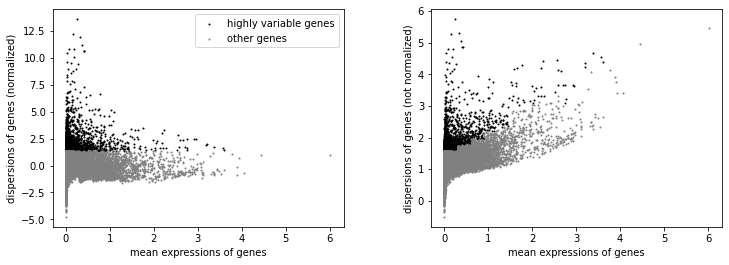

In [35]:
# adata_fib_original = adata_fib.copy()
# sc.pp.normalize_total(adata_fib, target_sum=1e4)
# sc.pp.log1p(adata_fib)
# sc.pp.highly_variable_genes(adata_fib, n_top_genes=1500)
# sc.pl.highly_variable_genes(adata_fib)

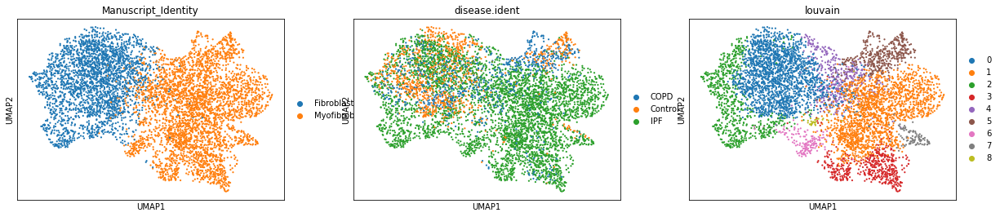

In [41]:
# adata_fib.raw = adata_fib
# adata_fib = adata_fib[:, adata_fib.var.highly_variable]
# sc.pp.regress_out(adata_fib, ['nUMI', 'percent.mito'])
# sc.pp.scale(adata_fib, max_value=10)
# sc.tl.pca(adata_fib, svd_solver='arpack')
# sc.pl.pca_variance_ratio(adata_fib, log=True)
# sc.pp.neighbors(adata_fib, n_neighbors=10, n_pcs=25)
# sc.tl.umap(adata_fib)
# sc.tl.louvain(adata_fib, resolution=0.45, random_state=7)
# sc.pl.umap(adata_fib, color=['Manuscript_Identity', 'disease.ident', 'louvain'])

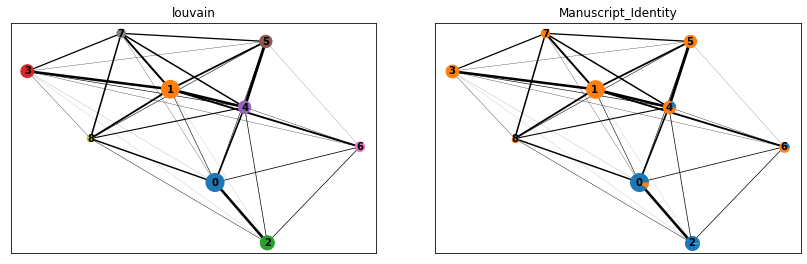

In [42]:
# sc.tl.paga(adata_fib, groups='louvain')
# sc.pl.paga(adata_fib, color=['louvain', 'Manuscript_Identity'])

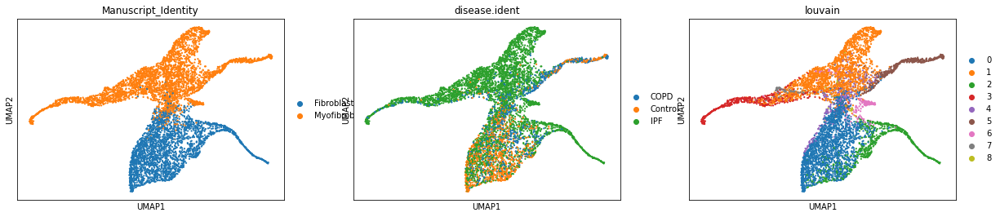

In [45]:
# sc.tl.diffmap(adata_fib, n_comps=5)
# sc.pp.neighbors(adata_fib, n_neighbors=80, use_rep='X_diffmap')
# sc.tl.umap(adata_fib, init_pos='paga', spread=0.8)
# sc.pl.umap(adata_fib, color=['Manuscript_Identity', 'disease.ident', 'louvain'])

In [72]:
# adata.sub = adata[(adata.obs['Manuscript_Identity'] == 'Myofibroblast') | (adata.obs['Manuscript_Identity'] == 'Fibroblast'),
#                  adata.var.index.isin(adata_fib.var.index)]
# adata.sub.obsm['X_umap'] = adata_fib.obsm['X_umap']
# adata.sub

View of AnnData object with n_obs × n_vars = 6166 × 1500
    obs: 'nGene', 'nUMI', 'orig.ident', 'library.ident', 'disease.ident', 'subject.ident', 'percent.mito', 'cell.type.desc.ident', 'cell.type.ident', 'cell.cat.ident', 'Manuscript_Identity', 'CellBarcode_Identity'
    var: 'Ensembl_GeneID'
    obsm: 'X_umap'

In [ ]:
# # Save subset of data with UMAP embeddings
# adata_sub = adata_fib_original[:,adata_fib_original.var.index.isin(adata_fib.var.index)]
# adata_sub.obsm['X_umap'] = adata_fib.obsm['X_umap']
# adata_sub.write('../data/lung/fibroblast.h5ad')

## Run scAAnet on fibroblast and myofibroblast

In [6]:
from scAAnet.api import scAAnet

In [10]:
adata = sc.read_h5ad('../data/lung/fibroblast.h5ad')
X_umap = adata.obsm['X_umap']

## Select K

In [ ]:
from scAAnet.tools import StabilityArchetype, StabilityUsage, PlotConsensusMat, PlotArchDistMat

In [ ]:
# This was run on Slurm in parallel with each combination of K and rs
# K: 2-10
# rs: 1-30
dists = ['P', 'ZIP', 'NB', 'ZINB']
K = int(sys.argv[1])
rs = int(sys.argv[2])

methodmap = {"P": "poisson", "ZIP": "zipoisson", 'NB': 'nb', 'ZINB': 'zinb'}

counts = sc.read_h5ad('../data/lung/fibroblast.h5ad')

hid_size = 96
batch_size = 256

epochs = 200

for dist in dists:
    preds, losses = scAAnet(counts, dispersion='gene-cell',
                         hidden_size=(hid_size, K, hid_size), ae_type=methodmap[dist],
                         epochs=epochs, batch_size=batch_size,
                         early_stop=100, reduce_lr=10, learning_rate=0.01, 
                         warm_up=20, random_state=rs, return_loss=True)
    
    recon, usage, spectra = preds['recon'], preds['usage'], preds['spectra']
    loss_value, loss_value_all = losses['loss'], losses['loss_all']

    usage = pd.DataFrame(usage, columns = np.arange(1,(K+1)), index=counts.obs.index)
    save_df_to_npz(usage, '../data/lung/selectK/fibroblast.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    spectra = pd.DataFrame(spectra.transpose(), columns = np.arange(1,(K+1)), index=counts.var.index)
    save_df_to_npz(spectra, '../data/lung/selectK/fibroblast.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    recon = pd.DataFrame(recon, columns=counts.var.index, index=counts.obs.index)
    save_df_to_npz(recon, '../data/lung/selectK/fibroblast.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
    
    open('../data/lung/fibroblast.loss.values.wu20.txt', 'a+').write('%s\t%s\t%s\t%s\t%s\n'%(K, rs, dist, loss_value, loss_value_all))

In [ ]:
# Assess the stability of archetype
dists = ["P", "ZIP", "NB", "ZINB"]
filepath = '../data/lung/selectK/fibroblast.program.wu20.%s.rs%d.k%s.df.npz'
savepath = '../data/lung/selectK/fibroblast.arch.all.wu20.%s.k%s.df.npz'
stab_arch = StabilityArchetype(2, 10, 1, 30, dists, filepath, savepath)
save_df_to_npz(stab_arch, '../data/lung/fibroblast.stability.arch.wu20.df.npz')

In [ ]:
# Plot archetype distance matrix of inferred usage
dists = ['P','ZIP','NB','ZINB']
K = np.arange(2,10+1)
colormap = sns.color_palette("coolwarm", as_cmap=True)
for k in K:
    for dist in dists:
        filepath = '../data/lung/selectK/fibroblast.arch.all.wu20.%s.k%s.df.npz' % (dist, k)
        savepath = '../data/lung/selectK/fibroblast.arch.clustering.wu20.%s.k%s.png' % (dist, k)
        PlotArchDistMat(filepath, savepath, colormap)

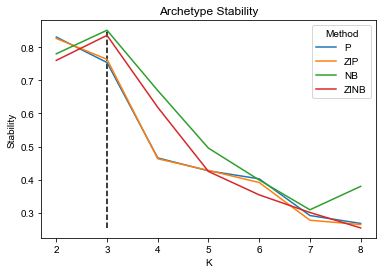

In [6]:
# Archetype stability over different Ks and distribution choices
stab_arch = load_df_from_npz('../data/lung/fibroblast.stability.arch.wu20.df.npz')
stab_arch = stab_arch.astype({'K': 'int32', 'Stability': 'float', 'Method': 'str'})
g = sns.lineplot(x= 'K', y = 'Stability', hue = 'Method', data=stab_arch)
g.set_title('Archetype Stability')
g.vlines(3, ymin=stab_arch.Stability.min(), ymax=stab_arch.Stability.max(), linestyle='--', colors='black')

In [ ]:
# Assess the stability of usage
dists = ["P", "ZIP", "NB", "ZINB"]
filepath = '../data/lung/selectK/fibroblast.usage.wu20.%s.rs%d.k%s.df.npz'
filepath_consensus = '../data/lung/selectK/fibroblast.consensus.matrix.wu20.%s.k%s.npy'
n_cells = 6166
stab_usage = StabilityUsage(5, 20, 1, 30, dists, n_cells, filepath, filepath_consensus, cluster=True, n_cells_max=50000)
save_df_to_npz(stab_usage, '../data/lung/fibroblast.stability.usage.wu20.df.npz')

In [ ]:
# Plot consensus clustering matrix of inferred usage
dists = ['P','ZIP','NB','ZINB']
K = np.arange(2,10+1)
colormap = sns.color_palette("coolwarm", as_cmap=True)
for k in K:
    for dist in dists:
        filepath = '../data/lung/selectK/fibroblast.consensus.matrix.wu20.%s.k%s.npy' % (dist, k)
        savepath = '../data/lung/selectK/fibroblast.consensus.matrix.wu20.%s.k%s.png' % (dist, k)
        PlotConsensusMat(filepath, savepath, colormap)

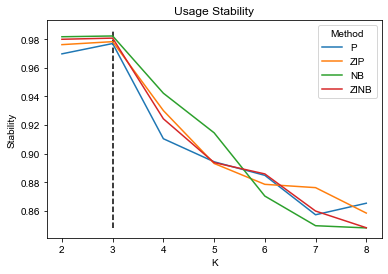

In [7]:
# Usage stability over different Ks and distribution choices
stab_usage = load_df_from_npz('../data/lung/fibroblast.stability.usage.wu20.df.npz')
stab_usage = stab_usage.astype({'K': 'int32', 'Stability': 'float', 'Method': 'str'})
g = sns.lineplot(x= 'K', y = 'Stability', hue = 'Method', data=stab_usage)
g.set_title('Usage Stability')
g.vlines(3, ymin=stab_usage.Stability.min(), ymax=stab_usage.Stability.max()+0.004, linestyle='--', colors='black')

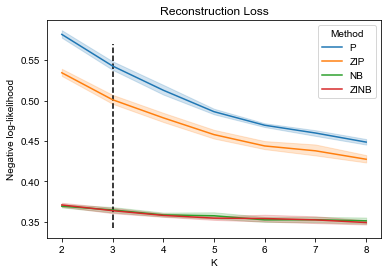

In [9]:
# Loss over different Ks and distribution choices
loss_all = pd.read_csv('../data/lung/fibroblast.loss.values.wu20.txt', sep='\t', header=None)
loss_all.columns = ['K','random state', 'Method', 'Loss','Loss_all']
loss_all = loss_all.astype({'K': 'int32', 'Loss': 'float', 'Loss_all': 'float', 'Method': 'category'})
loss_all['Method'] = loss_all['Method'].cat.reorder_categories(['P', 'ZIP', 'NB', 'ZINB'])
g = sns.lineplot(x= 'K', y = 'Loss', hue = 'Method', data=loss_all)
g.set_title('Reconstruction Loss')
g.set_ylabel('Negative log-likelihood')
g.vlines(3, ymin=loss_all.Loss.min(), ymax=0.57, linestyle='--', colors='black')

## Rerun scAAnet with selected K and larger epoch number

In [11]:
dist = 'NB'
rs = 1
K = 3
batch_size = 256
hid_size = 96
epochs = 400

In [ ]:
methodmap = {"P": "poisson", "ZIP": "zipoisson", 'NB': 'nb', 'ZINB': 'zinb'}
preds, losses = scAAnet(adata, dispersion='gene-cell',
                        hidden_size=(hid_size, K, hid_size), ae_type=methodmap[dist],
                        epochs=epochs, batch_size=batch_size,
                        early_stop=100, reduce_lr=10, learning_rate=0.01, 
                        warm_up=20, random_state=rs, return_loss=True)

In [ ]:
recon, usage, spectra = preds['recon'], preds['usage'], preds['spectra']

In [110]:
usage = pd.DataFrame(usage, columns = np.arange(1,(K+1)), index=adata.obs.index)
spectra = pd.DataFrame(spectra.transpose(), columns = np.arange(1,(K+1)), index=adata.var.index)
recon = pd.DataFrame(recon, columns=adata.var.index, index=adata.obs.index)

In [15]:
save_df_to_npz(spectra, '../data/lung/fibroblast.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
save_df_to_npz(usage, '../data/lung/fibroblast.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
save_df_to_npz(recon, '../data/lung/fibroblast.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))

/gpfs/ysm/home/yw599/venv/lib64/python3.6/site-packages/numpy/lib/format.py:356: UserWarning: metadata on a dtype may be saved or ignored, but will raise if saved when read. Use another form of storage.
  d['descr'] = dtype_to_descr(array.dtype)


In [12]:
spectra = load_df_from_npz('../data/lung/fibroblast.program.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
usage = load_df_from_npz('../data/lung/fibroblast.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
recon = load_df_from_npz('../data/lung/fibroblast.recon.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))

In [13]:
dic = {1:2, 2:1, 3:3}
order = list(map(dic.get, [1,2,3]))
usage.columns = order
spectra.columns = order
usage = usage[[1,2,3]]
spectra = spectra[[1,2,3]]

## Assess the sparsity of inferred usage through minimum usage

In [13]:
adata.obs['min_usage'] = usage.min(1)
adata.obs["min_range"] = pd.cut(adata.obs['min_usage'], bins=[0,0.01,0.02,0.05,0.1,1.], right=False)
df = adata.obs.groupby(["min_range", "Manuscript_Identity"]).size().to_frame()
df.reset_index(inplace=True)
df = df.rename(columns={0:'count'})
df['per'] = df['count']
temp = df.groupby(["Manuscript_Identity"]).sum()['count']
for c in temp.index:
    df.loc[df['Manuscript_Identity'] == c,'per'] = df[df['Manuscript_Identity'] == c]['per']/temp[c]

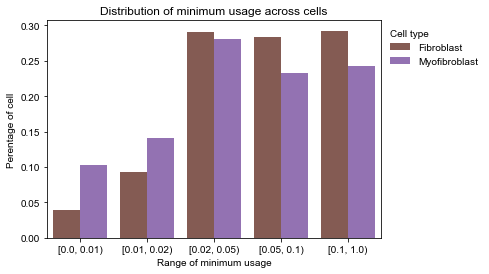

In [15]:
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
g = sns.barplot(x='min_range',y='per',hue='Manuscript_Identity', palette=lut1, data=df)
g.set_ylabel('Perentage of cell')
g.set_xlabel('Range of minimum usage')
g.set_title('Distribution of minimum usage across cells')
handles, labels = g.get_legend_handles_labels()
leg = g.legend(handles, labels, 
             bbox_to_anchor=(1, 1), loc=2, title='Cell type', frameon=False)
leg._legend_box.align = "left"

## Assess the sharing of GEPs through maximum usage

In [16]:
adata.obs['max_usage'] = usage.max(1)
adata.obs["max_range"] = pd.cut(adata.obs['max_usage'], bins=[0,0.2,0.4,0.6,0.8,1.], right=False)
df = adata.obs.groupby(["max_range", "Manuscript_Identity"]).size().to_frame()
df.reset_index(inplace=True)
df = df.rename(columns={0:'count'})
df['per'] = df['count']
temp = df.groupby(["Manuscript_Identity"]).sum()['count']
for c in temp.index:
    df.loc[df['Manuscript_Identity'] == c,'per'] = df[df['Manuscript_Identity'] == c]['per']/temp[c]

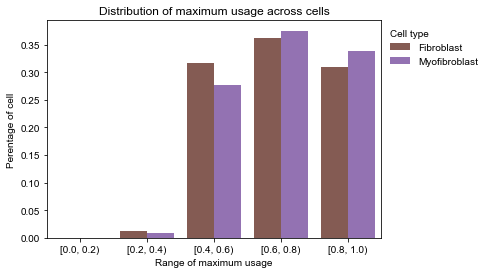

In [18]:
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
g = sns.barplot(x='max_range',y='per',hue='Manuscript_Identity', palette=lut1, data=df)
g.set_ylabel('Perentage of cell')
g.set_xlabel('Range of maximum usage')
g.set_title('Distribution of maximum usage across cells')
handles, labels = g.get_legend_handles_labels()
leg = g.legend(handles, labels, 
             bbox_to_anchor=(1, 1), loc=2, title='Cell type', frameon=False)
leg._legend_box.align = "left"

## MDS visualization of archetypal space

In [14]:
from sklearn.manifold import MDS

In [15]:
data_at = usage.to_numpy()
embedding = MDS(n_components=2)
Y_mds_ats = embedding.fit_transform(np.transpose(spectra))
Y_mds_data = data_at @ Y_mds_ats

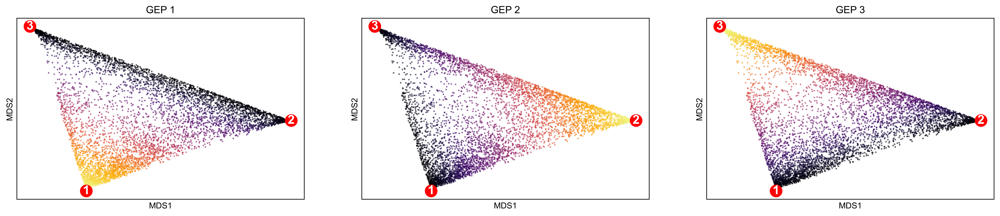

In [16]:
(fig, ax) = plt.subplots(1,K,figsize=(7*K, 4), dpi=600)
plt.suptitle('')
for i in range(K):
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_xlabel('MDS1')
    ax[i].set_ylabel('MDS2')
    g = ax[i].scatter(Y_mds_data[:,0], Y_mds_data[:,1], s=1, alpha=0.5,
               cmap='inferno', c=usage.iloc[:, i], vmin=0, vmax=1)
    ax[i].set_title('GEP %d' % (i+1))
    ax[i].scatter(Y_mds_ats[:,0], Y_mds_ats[:,1], s=200, c='r', zorder=3)
    for k in range(Y_mds_ats.shape[0]):
        ax[i].text(Y_mds_ats[k,0], Y_mds_ats[k,1], k+1, horizontalalignment='center', verticalalignment='center', 
                   fontdict={'color': 'white','size':15,'weight':'bold'}, zorder=4)

In [17]:
adata.obsm['X_umap'] = Y_mds_data

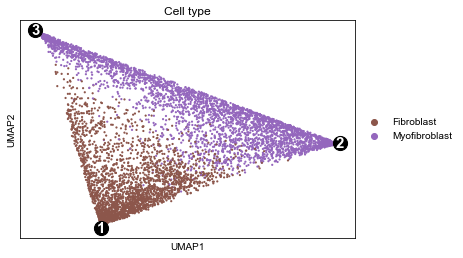

In [18]:
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
(fig, ax) = plt.subplots(1,1)
for i in range(K):
    ax.scatter(Y_mds_ats[i,0], Y_mds_ats[i,1], s=200, c='k', zorder=3)
    ax.text(Y_mds_ats[i,0], Y_mds_ats[i,1], i+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':15,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="Manuscript_Identity", ax=ax, palette=lut1, title='Cell type')

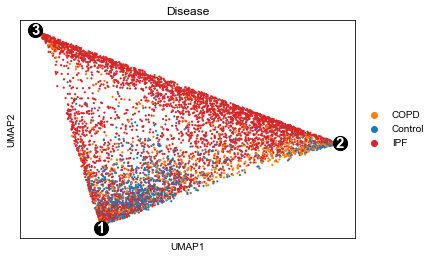

In [19]:
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
(fig, ax) = plt.subplots(1,1)
for i in range(K):
    ax.scatter(Y_mds_ats[i,0], Y_mds_ats[i,1], s=200, c='k', zorder=3)
    ax.text(Y_mds_ats[i,0], Y_mds_ats[i,1], i+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':15,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="disease.ident", ax=ax, palette=lut2, title = 'Disease')

## UMAP Visualization

In [45]:
for i in range(usage.shape[1]):
    adata.obs["GEP %s"%(i+1)] = usage.iloc[:,i]
adata.obsm["X_scaanet"] = usage

In [12]:
# ASW
print(silhouette_score(adata.obsm['X_umap'], adata.obs['Manuscript_Identity']))
print(silhouette_score(adata.obsm['X_scaanet'], adata.obs['Manuscript_Identity']))

0.40371168
0.46620736


In [16]:
arch_loc = usage.to_numpy().argmax(0)

In [17]:
arch_loc

array([2902, 3895, 1314])

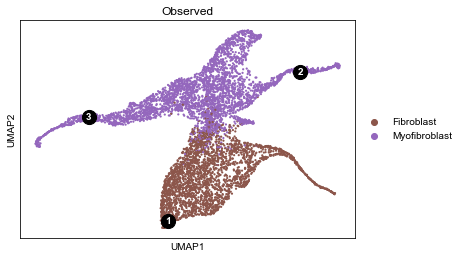

In [18]:
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
(fig, ax) = plt.subplots(1,1)
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap[i,0], X_umap[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap[i,0], X_umap[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="Manuscript_Identity", ax=ax, title='Observed', palette=lut1)

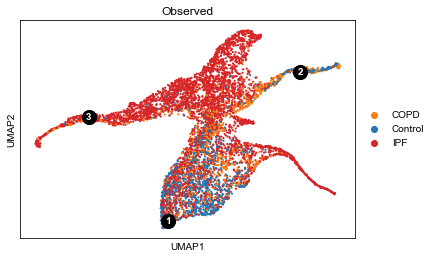

In [18]:
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
(fig, ax) = plt.subplots(1,1)
for num,i in enumerate(arch_loc):
    ax.scatter(X_umap[i,0], X_umap[i,1], s=200, c='k', zorder=3)
    ax.text(X_umap[i,0], X_umap[i,1], num+1, horizontalalignment='center', verticalalignment='center', 
            fontdict={'color':'white','size':10,'weight':'bold'}, zorder=4)
sc.pl.umap(adata, color="disease.ident", ax=ax, title='Observed', palette=lut2)

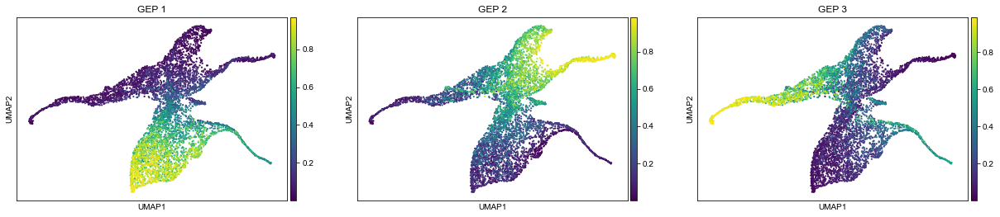

In [19]:
sc.pl.umap(adata, color=["GEP %s"%(i+1) for i in range(usage.shape[1])], ncols=3)

# Various plots

In [30]:
gep_order = [1,3,2]
usage_sorted = usage.loc[:,gep_order]
usage_sorted.columns = ['GEP %d'%i for i in usage_sorted.columns]

[None, None, None, None, None, None]

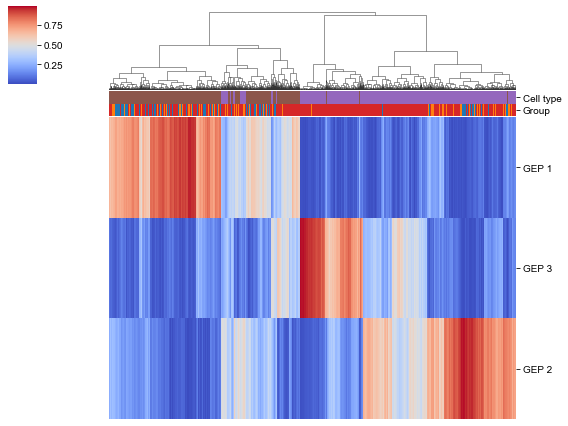

In [33]:
# Heatmap of cell usage matrix
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
col_colors1 = adata.obs['Manuscript_Identity'].map(lut1).rename('Cell type')
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
col_colors2 = adata.obs['disease.ident'].map(lut2).rename('Group')
col_colors = pd.concat([col_colors1, col_colors2],axis=1)
cmap = sns.color_palette("coolwarm", as_cmap=True)
cg = sns.clustermap(usage_sorted.transpose(), xticklabels=False, figsize=(8,6),
               row_cluster=False, col_cluster=True, col_colors=col_colors, cmap=cmap)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

In [34]:
ct_order = [(   'Fibroblast',     'IPF'),
            (   'Fibroblast',    'COPD'),
            (   'Fibroblast', 'Control'),
            ('Myofibroblast',     'IPF'),
            ('Myofibroblast',    'COPD'),
            ('Myofibroblast', 'Control')]
cmap = sns.color_palette("rocket_r", as_cmap=True)

[None, None, None, None, None, None]

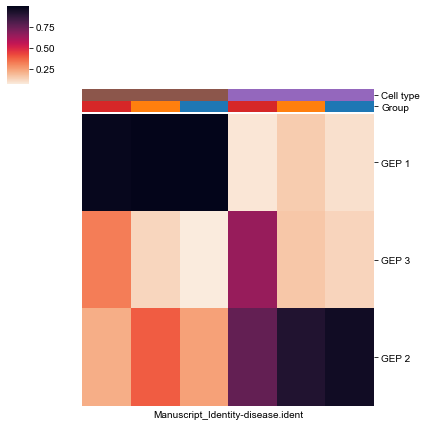

In [36]:
# % Cells With GEP Usage > 25% by Published Cluster
percent_group_usage = usage.groupby([adata.obs["Manuscript_Identity"], adata.obs["disease.ident"]], axis=0).apply(lambda x: (x>.25).mean())
percent_group_usage = percent_group_usage.loc[:,gep_order]
percent_group_usage.columns = ['GEP %d'%i for i in percent_group_usage.columns]
percent_group_usage = percent_group_usage.loc[ct_order]
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
col_colors1 = percent_group_usage.index.get_level_values('Manuscript_Identity').map(lut1).rename('Cell type')
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
col_colors2 = percent_group_usage.index.get_level_values('disease.ident').map(lut2).rename('Group')
col_colors = pd.DataFrame({'Cell type': col_colors1.values, 'Group': col_colors2.values}, index=ct_order)
cg = sns.clustermap(percent_group_usage.transpose(), xticklabels=False, figsize=(6,6),
               row_cluster=False, col_cluster=False, col_colors=col_colors, cmap=cmap)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

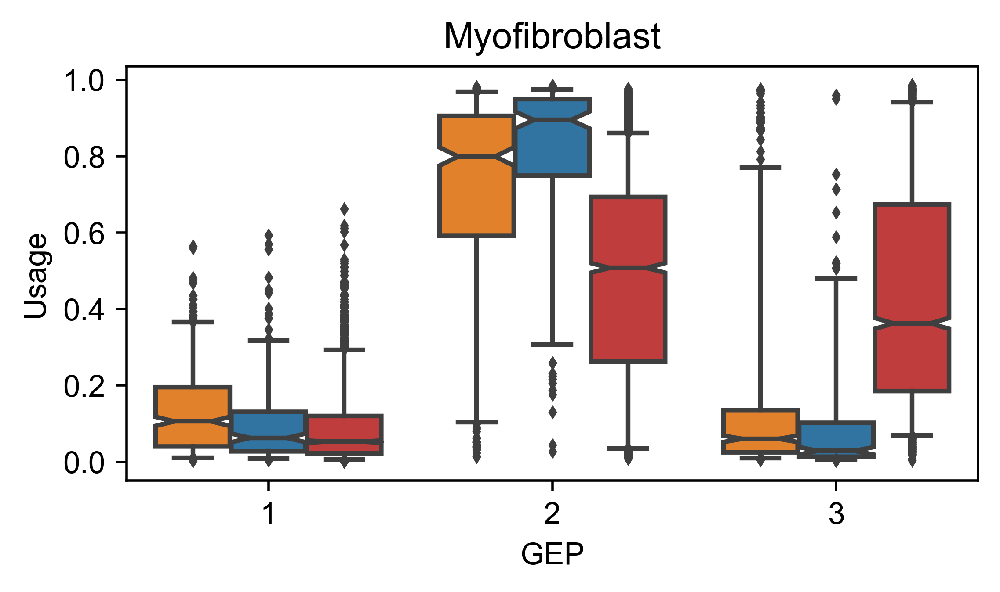

In [45]:
K = 3
usage_matrix_norm_labeled = usage.copy()
gep_usage_by_cluster_flat = usage_matrix_norm_labeled.unstack().reset_index()
gep_usage_by_cluster_flat.columns = ['GEP', 'Cell', 'Usage']
gep_usage_by_cluster_flat = pd.merge(left=gep_usage_by_cluster_flat, right=adata.obs[['Manuscript_Identity', 'disease.ident']],
                                     left_on='Cell', right_index=True, how='left')
clusters = ['Myofibroblast', 'Fibroblast']
n_clusters = len(clusters)
order = np.arange(1,K+1)

subdat = gep_usage_by_cluster_flat.loc[gep_usage_by_cluster_flat['Manuscript_Identity']=='Myofibroblast',:]
fig, ax = plt.subplots(figsize=(5,2.5), dpi=500)
sns.boxplot(x='GEP', y='Usage', hue='disease.ident', data=subdat, order=order,
            ax=ax, fliersize=2, notch=True, whis=[5, 95], palette=lut2)
ax.set_title('Myofibroblast')
# ax.legend(bbox_to_anchor=(1,1), loc=2, fontsize=6)
ax.legend([],[], frameon=False)

In [15]:
usage_matrix_norm_labeled = usage.copy()
gep_usage_by_cluster_flat = usage_matrix_norm_labeled.unstack().reset_index()
gep_usage_by_cluster_flat.columns = ['GEP', 'Cell', 'Usage']
gep_usage_by_cluster_flat = pd.merge(left=gep_usage_by_cluster_flat, right=adata.obs[['Manuscript_Identity', 'disease.ident']],
                                     left_on='Cell', right_index=True, how='left')
clusters = ['Myofibroblast', 'Fibroblast']
n_clusters = len(clusters)
order = np.arange(1,K+1)

subdat = gep_usage_by_cluster_flat.loc[gep_usage_by_cluster_flat['Manuscript_Identity']=='Myofibroblast',:]

In [30]:
# Wilcoxon rank sum test
for i in range(1,4):
    print('GEP %d'%i)
    subdat_sub = subdat[subdat.GEP==i]
    # IPF vs Control
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='IPF'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='Control'].Usage.values))
    # IPF vs COPD
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='IPF'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='COPD'].Usage.values))
    # COPD vs Control
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='COPD'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='Control'].Usage.values))

GEP 1
RanksumsResult(statistic=-1.9900684940186066, pvalue=0.04658339086389206)
RanksumsResult(statistic=-8.979162783302046, pvalue=2.72834858560232e-19)
RanksumsResult(statistic=3.925973963886005, pvalue=8.637949933948203e-05)
GEP 2
RanksumsResult(statistic=-16.2234391865998, pvalue=3.44360397748833e-59)
RanksumsResult(statistic=-17.492799176249918, pvalue=1.6257226487735554e-68)
RanksumsResult(statistic=-5.170669716974373, pvalue=2.3325651790608669e-07)
GEP 3
RanksumsResult(statistic=18.56593340649431, pvalue=6.0624283519847655e-77)
RanksumsResult(statistic=22.789977788056, pvalue=5.764471655470753e-115)
RanksumsResult(statistic=5.006795669962364, pvalue=5.534362216547359e-07)


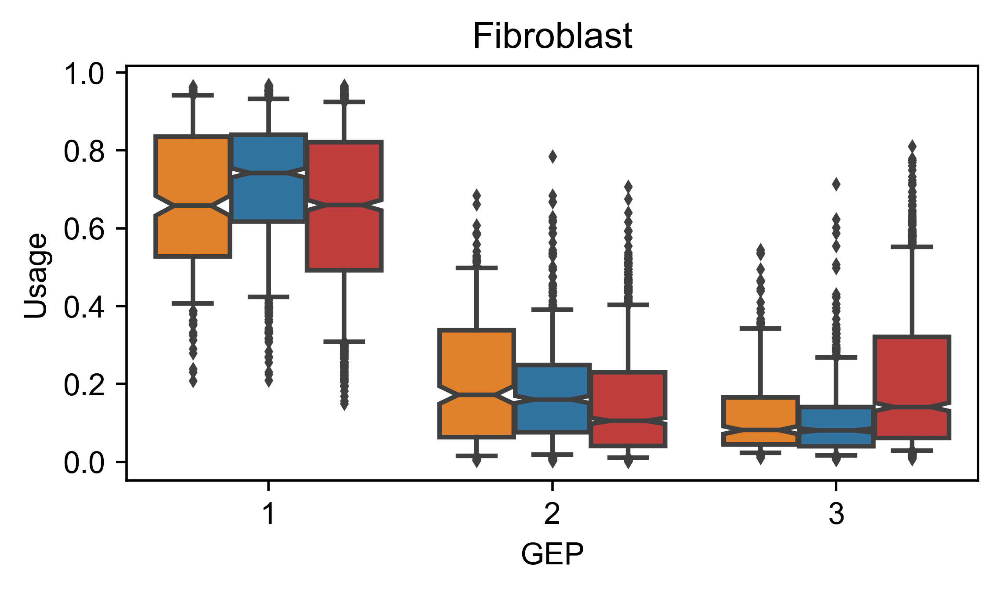

In [36]:
K = 3
usage_matrix_norm_labeled = usage.copy()
gep_usage_by_cluster_flat = usage_matrix_norm_labeled.unstack().reset_index()
gep_usage_by_cluster_flat.columns = ['GEP', 'Cell', 'Usage']
gep_usage_by_cluster_flat = pd.merge(left=gep_usage_by_cluster_flat, right=adata.obs[['Manuscript_Identity', 'disease.ident']],
                                     left_on='Cell', right_index=True, how='left')
clusters = ['Myofibroblast', 'Fibroblast']
n_clusters = len(clusters)
order = np.arange(1,K+1)

subdat = gep_usage_by_cluster_flat.loc[gep_usage_by_cluster_flat['Manuscript_Identity']=='Fibroblast',:]
fig, ax = plt.subplots(figsize=(5,2.5), dpi=500)
sns.boxplot(x='GEP', y='Usage', hue='disease.ident', data=subdat, order=order,
            ax=ax, fliersize=2, notch=True, whis=[5, 95], palette=lut2)
ax.set_title('Fibroblast')
ax.legend([],[], frameon=False)

In [31]:
usage_matrix_norm_labeled = usage.copy()
gep_usage_by_cluster_flat = usage_matrix_norm_labeled.unstack().reset_index()
gep_usage_by_cluster_flat.columns = ['GEP', 'Cell', 'Usage']
gep_usage_by_cluster_flat = pd.merge(left=gep_usage_by_cluster_flat, right=adata.obs[['Manuscript_Identity', 'disease.ident']],
                                     left_on='Cell', right_index=True, how='left')
clusters = ['Myofibroblast', 'Fibroblast']
n_clusters = len(clusters)
order = np.arange(1,K+1)

subdat = gep_usage_by_cluster_flat.loc[gep_usage_by_cluster_flat['Manuscript_Identity']=='Fibroblast',:]

In [33]:
# Wilcoxon rank sum test
for i in range(1,4):
    print('GEP %d'%i)
    subdat_sub = subdat[subdat.GEP==i]
    print("IPF vs Control")
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='IPF'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='Control'].Usage.values))
    print("IPF vs COPD")
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='IPF'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='COPD'].Usage.values))
    print("COPD vs Control")
    print(stats.ranksums(subdat_sub[subdat_sub["disease.ident"]=='COPD'].Usage.values, 
                         subdat_sub[subdat_sub["disease.ident"]=='Control'].Usage.values))

GEP 1
IPF vs Control
RanksumsResult(statistic=-8.167726748121394, pvalue=3.1425471224343193e-16)
IPF vs COPD
RanksumsResult(statistic=-1.629655272599925, pvalue=0.10317437547162019)
COPD vs Control
RanksumsResult(statistic=-4.468711467594378, pvalue=7.869219238952282e-06)
GEP 2
IPF vs Control
RanksumsResult(statistic=-6.951796537531157, pvalue=3.6066332780482743e-12)
IPF vs COPD
RanksumsResult(statistic=-6.6681832626963855, pvalue=2.5898926540428404e-11)
COPD vs Control
RanksumsResult(statistic=2.414950371475377, pvalue=0.015737353793521862)
GEP 3
IPF vs Control
RanksumsResult(statistic=13.600788876231414, pvalue=3.9613741209071203e-42)
IPF vs COPD
RanksumsResult(statistic=8.30560284662812, pvalue=9.931390444560096e-17)
COPD vs Control
RanksumsResult(statistic=1.8873156753602818, pvalue=0.059117879312061666)


In [25]:
3.9613741209071203e-42*18

7.130473417632817e-41

In [26]:
9.931390444560096e-17*18

1.7876502800208174e-15

In [27]:
0.059117879312061666*18

1.06412182761711

# Look at GEPs

In [8]:
gene_score = geneScore(spectra)

In [49]:
ncol = 3

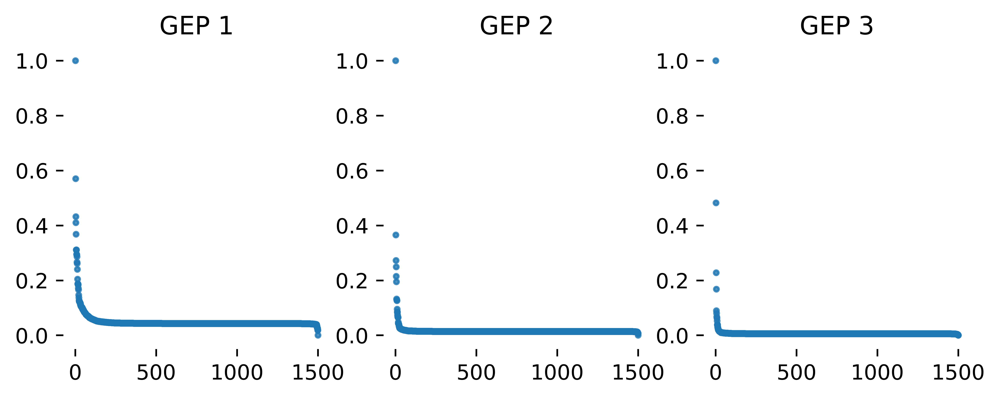

In [98]:
# Ranked gene scores in each GEP
plotRankedGeneScore(gene_score, ncol)

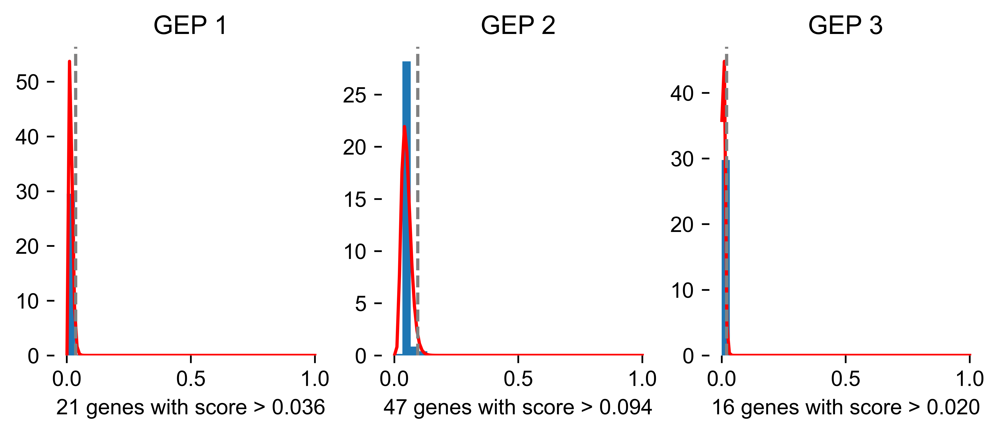

In [159]:
# Density plot of gene scores fitted by Gamma distributions in each GEP
gep_genes = plotDensityGamma(gene_score, ncol)

In [161]:
for key in list(gep_genes.keys()):
    print(key)
    print('[%s]' % ', '.join(map(str, gep_genes[key])))

GEP 1
[CFD, PLA2G2A, IGFBP6, SLPI, GSN, MFAP5, SFRP2, APOD, CCDC80, GPX3, SFRP4, IGFBP5, CLU, CYP4Z2P, MT1X, PI16, MT1M, CXCL14, EBF1, EXOSC7, PDZRN4]
GEP 2
[A2M, LIMCH1, INMT, SCN7A, ITGA8, GPX3, FMO2, ROBO2, PTGDS, GPC3, C7, PPP1R14A, ENSG00000278996, ENSG00000280441, DEPP1, NPNT, RAPGEF5, CCBE1, CACNA1D, ADGRB3, FN1, AOC3, PDK4, NEBL, CFD, INPP4B, ADAMTS8, GPM6B, ENSG00000239268, COL6A6, GRIA1, CDH13, FAT3, ENSG00000224228, DLGAP1, HIF3A, CACNB2, NCAM2, MAML3, NAV2, ENSG00000275757, VEGFD, CCDC102B, AASS, CTGF, FGFR4, NKD1]
GEP 3
[COL1A1, COL3A1, POSTN, FN1, CTHRC1, TIMP1, TNC, MMP11, ASPN, ADAM12, KIF26B, MTCO1P40, COL12A1, TGFBI, PCDH7, FAM155A]


In [52]:
markers_gene = []
for k in gep_genes.keys():
    markers_gene = markers_gene + list(gep_genes[k])
gene_score_sub = gene_score.loc[markers_gene,:]

In [53]:
gep_order = [1,2,3]
gene_score_sub = gene_score_sub.loc[:,gep_order]
gene_score_sub.columns = ["GEP %d"%i for i in gene_score_sub.columns]

[Text(0.5, 0, 'CFD'),
 Text(1.5, 0, 'PLA2G2A'),
 Text(2.5, 0, 'IGFBP6'),
 Text(3.5, 0, 'SLPI'),
 Text(4.5, 0, 'GSN'),
 Text(5.5, 0, 'MFAP5'),
 Text(6.5, 0, 'SFRP2'),
 Text(7.5, 0, 'APOD'),
 Text(8.5, 0, 'CCDC80'),
 Text(9.5, 0, 'GPX3'),
 Text(10.5, 0, 'SFRP4'),
 Text(11.5, 0, 'IGFBP5'),
 Text(12.5, 0, 'CLU'),
 Text(13.5, 0, 'CYP4Z2P'),
 Text(14.5, 0, 'MT1X'),
 Text(15.5, 0, 'PI16'),
 Text(16.5, 0, 'MT1M'),
 Text(17.5, 0, 'CXCL14'),
 Text(18.5, 0, 'EBF1'),
 Text(19.5, 0, 'EXOSC7'),
 Text(20.5, 0, 'PDZRN4'),
 Text(21.5, 0, 'A2M'),
 Text(22.5, 0, 'LIMCH1'),
 Text(23.5, 0, 'INMT'),
 Text(24.5, 0, 'SCN7A'),
 Text(25.5, 0, 'ITGA8'),
 Text(26.5, 0, 'GPX3'),
 Text(27.5, 0, 'FMO2'),
 Text(28.5, 0, 'ROBO2'),
 Text(29.5, 0, 'PTGDS'),
 Text(30.5, 0, 'GPC3'),
 Text(31.5, 0, 'C7'),
 Text(32.5, 0, 'PPP1R14A'),
 Text(33.5, 0, 'ENSG00000278996'),
 Text(34.5, 0, 'ENSG00000280441'),
 Text(35.5, 0, 'DEPP1'),
 Text(36.5, 0, 'NPNT'),
 Text(37.5, 0, 'RAPGEF5'),
 Text(38.5, 0, 'CCBE1'),
 Text(39.5, 0, 'CACNA1

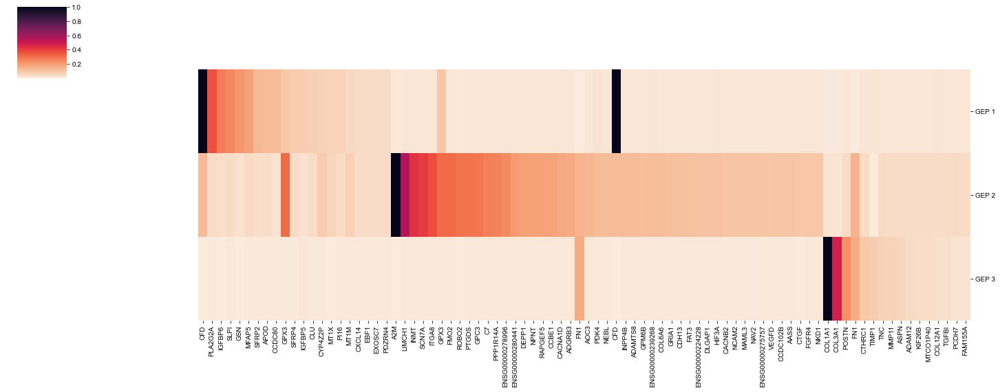

In [55]:
# Heatmap of GEP matrix for given genes
cmap = sns.color_palette("rocket_r", as_cmap=True)
cg = sns.clustermap(gene_score_sub.transpose(), figsize=(20,8),
               row_cluster=False, col_cluster=False, cmap=cmap, xticklabels=True)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg.ax_heatmap.set_xticklabels(cg.ax_heatmap.get_xmajorticklabels(), fontsize = 10)

# Run DEG tests using inferred usage

In [ ]:
from scAAnet.tools import programDEG

In [ ]:
test_use = 'nb_naive'
offset = True
dist = 'ZINB'
rs = 1
K = 3

usage = load_df_from_npz('../data/lung/fibroblast.usage.wu20.%s.rs%d.k%s.df.npz'%(dist, rs, K))
count = sc.read_h5ad('../data/lung/fibroblast.h5ad')
resultsfn = '../data/lung/fibroblast.deg.wu20.%s.rs%d.k%s.%s.%s.pkl' % (dist, rs, K, test_use, offset)

usage = usage.to_numpy()
count = pd.DataFrame(count.X.todense(), index=count.obs.index, columns=count.var.index)

results = programDEG(count, usage, test_use, offset, min_counts_per_cell=30)
f = open(resultsfn, 'wb')
pickle.dump(results, f)
f.close()

In [47]:
import pickle
with open('../data/lung/fibroblast.deg.wu20.%s.rs%d.k%s.nb_naive.True.pkl' % (dist, rs, K), 'rb') as f:
    deg = pickle.load(f)

In [48]:
for i, old_key in enumerate(list(deg.keys())):
    new_key = i+1
    deg[new_key] = deg.pop(old_key)
dic = {1:'gep_2', 2:'gep_1', 3:'gep_3'}
for old_key in list(deg.keys()):
    new_key = dic[old_key]
    deg[new_key] = deg.pop(old_key)

In [32]:
keys = list(deg.keys())
for i in range(len(deg)):
    re = deg[keys[i]]
    #re = re[re['z.score']>0]
    print('%s:'%(keys[i]), np.sum(re['p.val.adj'] < 0.05))
    print(re.sort_values(by='p.val.adj').head(20))

gep_2: 741
                 gene  coef.est  p.val    z.score  p.val.adj
458              GPC3  4.004723    0.0  51.207011        0.0
167            COL1A1 -2.286477    0.0 -46.527711        0.0
165              CCL2  1.928117    0.0  38.404473        0.0
604              PI16 -6.860274    0.0 -38.679915        0.0
366             SCN7A  3.481432    0.0  55.622253        0.0
158             PTGDS  2.590556    0.0  54.203851        0.0
594             ITGA2  3.457002    0.0  38.614814        0.0
151             SFRP4 -3.708803    0.0 -47.221411        0.0
661              NPNT  4.349499    0.0  44.189086        0.0
42             LIMCH1  3.786232    0.0  56.380697        0.0
1085             INMT  3.272330    0.0  47.862733        0.0
465               GSN -2.114950    0.0 -38.811939        0.0
481          CCDC102B  2.874700    0.0  48.389285        0.0
100              FMO2  3.067421    0.0  38.746741        0.0
792             CCBE1  3.399592    0.0  51.367159        0.0
491          

In [164]:
# Save DEG results sorted by adjusted p values and separated by the sign of coefs to file
keys = list(deg.keys())
for i in range(len(deg)):
    re = deg[keys[i]]
    re = re.sort_values(by='p.val.adj')
    re_pos = re[re['z.score']>0]
    re_neg = re[re['z.score']<0]
    re_pos.to_excel('../data/lung/fibroblast.deg.%s.pos.wu20.%s.rs%d.k%s.nb_naive.True.xlsx' 
                    % (keys[i], dist, rs, K))
    re_neg.to_excel('../data/lung/fibroblast.deg.%s.neg.wu20.%s.rs%d.k%s.nb_naive.True.xlsx' 
                    % (keys[i], dist, rs, K))

In [ ]:
adata_sub = adata.copy()
sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)
adata_sub.raw = adata_sub
sc.pp.scale(adata_sub, max_value=10)
sc.tl.pca(adata_sub, svd_solver='arpack')

In [55]:
gep_num = 1 # substitute with 2 or 3
gene_num = 20
re = deg['gep_%d' % gep_num]
re = re.sort_values(by='z.score', ascending=False)
re_pos = re[re['z.score']>0]
re_neg = re[re['z.score']<0]
gene_list = list(re_pos.gene[:gene_num]) + list(re_neg.gene[:-(gene_num+1):-1])
gene_list = list(re_pos.gene[:gene_num])

exp_sub = pd.DataFrame(adata_sub.raw.X.todense(), index=adata_sub.obs.index, columns=adata_sub.var.index)
exp_sub = exp_sub[gene_list]
exp_sub = exp_sub.sub(exp_sub.min(axis=0), axis='columns').div(exp_sub.max(axis=0)-exp_sub.min(axis=0), axis='columns')
exp_sub['GEP %d usage'%gep_num] = adata_sub.obs['GEP %d'%gep_num].values
cell_sorted = exp_sub.sort_values(by='GEP %d usage'%gep_num).index
exp_sub = exp_sub.loc[cell_sorted,:]
exp_sub.columns.name = None

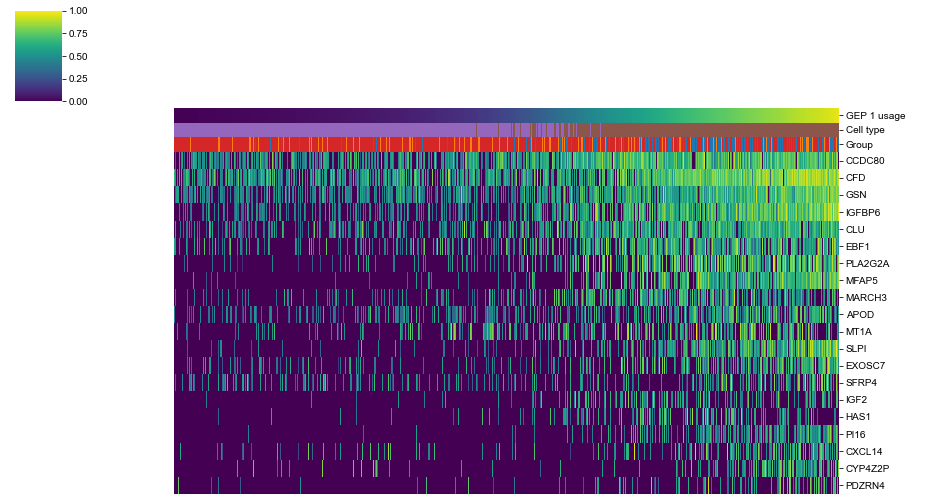

In [115]:
# GEP 1
cmap = sns.color_palette("viridis", as_cmap=True)
col_colors = exp_sub.iloc[:,gene_num].map(cmap)
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
col_colors1 = adata_sub.obs['Manuscript_Identity'].map(lut1).rename('Cell type')
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
col_colors2 = adata_sub.obs['disease.ident'].map(lut2).rename('Group')
col_colors = pd.concat([col_colors, col_colors1, col_colors2],axis=1)
col_colors = col_colors.rename(columns={'GEP %d usage' % gep_num: 'GEP %d usage      ' % gep_num})

# Order gene by the area under curve (y: expression, x: cell usage)
auc = np.array([np.trapz(y=exp_sub[g].values, x=exp_sub['GEP 1 usage'].values) for g in gene_list])
order = auc.argsort()[::-1]

cg = sns.clustermap(exp_sub.iloc[:,:gene_num].transpose().iloc[order,:], xticklabels=False, figsize=(13,7),
               row_cluster=False, col_cluster=False, 
               col_colors=col_colors, cmap=cmap)

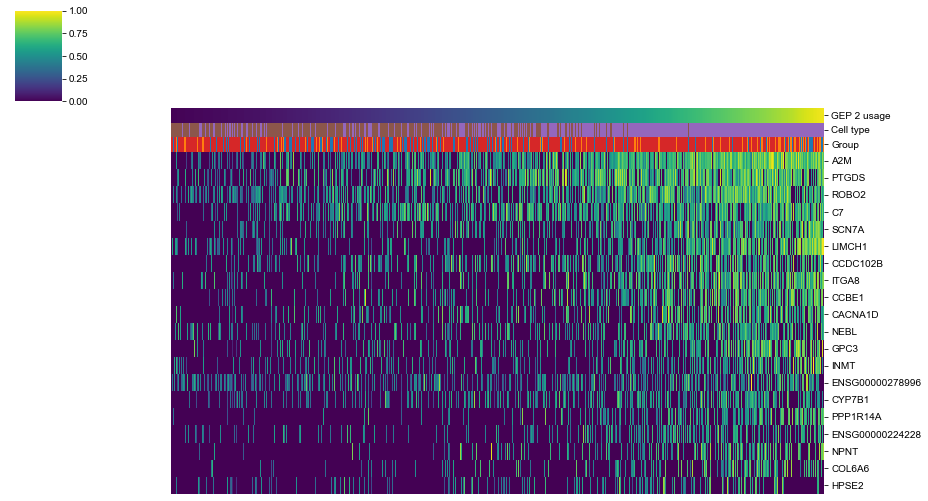

In [118]:
# GEP 2
cmap = sns.color_palette("viridis", as_cmap=True)
col_colors = exp_sub.iloc[:,gene_num].map(cmap)
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
col_colors1 = adata_sub.obs['Manuscript_Identity'].map(lut1).rename('Cell type')
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
col_colors2 = adata_sub.obs['disease.ident'].map(lut2).rename('Group')
col_colors = pd.concat([col_colors, col_colors1, col_colors2],axis=1)
col_colors = col_colors.rename(columns={'GEP %d usage' % gep_num: 'GEP %d usage      ' % gep_num})

# Order gene by the area under curve (y: expression, x: cell usage)
auc = np.array([np.trapz(y=exp_sub[g].values, x=exp_sub['GEP 2 usage'].values) for g in gene_list])
order = auc.argsort()[::-1]

cg = sns.clustermap(exp_sub.iloc[:,:gene_num].transpose().iloc[order,:], xticklabels=False, figsize=(13,7),
               row_cluster=False, col_cluster=False, 
               col_colors=col_colors, cmap=cmap)

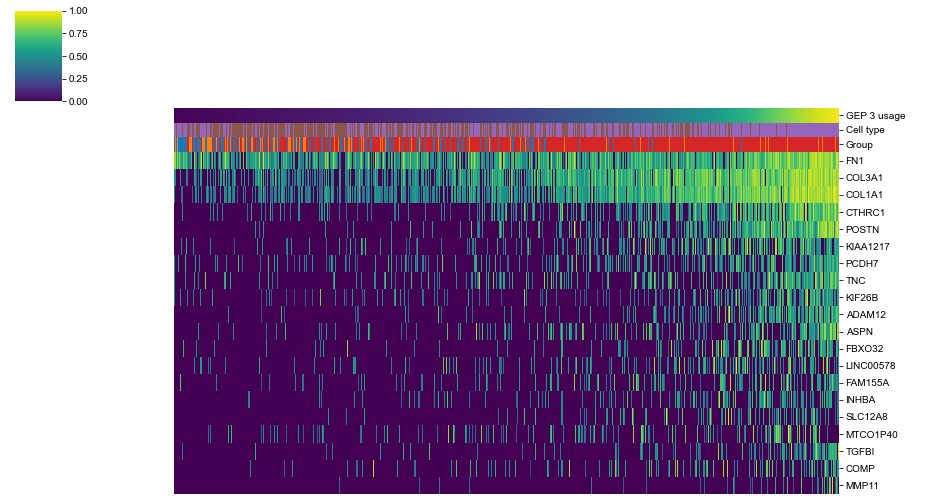

In [121]:
# GEP 3
cmap = sns.color_palette("viridis", as_cmap=True)
col_colors = exp_sub.iloc[:,gene_num].map(cmap)
lut1 = {'Myofibroblast':'#9467bd', 'Fibroblast':'#8c564b'}
col_colors1 = adata_sub.obs['Manuscript_Identity'].map(lut1).rename('Cell type')
lut2 = {'IPF': '#d62728', 'COPD': '#ff7f0e', 'Control': '#1f77b4'}
col_colors2 = adata_sub.obs['disease.ident'].map(lut2).rename('Group')
col_colors = pd.concat([col_colors, col_colors1, col_colors2],axis=1)
col_colors = col_colors.rename(columns={'GEP %d usage' % gep_num: 'GEP %d usage      ' % gep_num})

# Order gene by the area under curve (y: expression, x: cell usage)
auc = np.array([np.trapz(y=exp_sub[g].values, x=exp_sub['GEP 3 usage'].values) for g in gene_list])
order = auc.argsort()[::-1]

# Switch COL3A1 and FN1
temp = order[0]
order[0] = order[1]
order[1] = temp

cg = sns.clustermap(exp_sub.iloc[:,:gene_num].transpose().iloc[order,:], xticklabels=False, figsize=(13,7),
               row_cluster=False, col_cluster=False, 
               col_colors=col_colors, cmap=cmap)

## Enrichment analysis

In [ ]:
# gmt files including gene symbols for pathways can be downloaded from 
# http://www.gsea-msigdb.org/gsea/msigdb/collections.jsp

In [25]:
import gseapy as gp

In [26]:
adata = sc.read_h5ad('../data/lung/fibroblast.h5ad')

In [27]:
keys = list(deg.keys())
re_1 = deg['gep_1']
re_1 = re_1.sort_values(by='z.score', ascending=False)
re_2 = deg['gep_2']
re_2 = re_2.sort_values(by='z.score', ascending=False)
re_3 = deg['gep_3']
re_3 = re_3.sort_values(by='z.score', ascending=False)

In [23]:
# Only perform DE test for highly variable genes

# Background genes
bg_gene = adata.var.index.tolist()

# Ordered gene list
glist = re_1.gene.tolist()

# Number of significantly positive genes
n_gene = np.sum((re_1['z.score']>0) & (re_1['p.val.adj']<0.05))
print('There are %d significantly up-regulated genes.' %n_gene)

# if n_gene > int(len(bg_gene)*0.1):
#     n_gene = int(len(bg_gene)*0.1)

# Enrichr using GO BP
enr_1 = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c5.go.bp.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_1/enrichr_go_bp',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

# Enrichr using REACTOME
enr_1_ = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c2.cp.reactome.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_1/enrichr_reactome',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

2021-07-31 17:39:13,423 User Defined gene sets is given: ../MSigDB/c5.go.bp.v7.4.symbols.gmt
2021-07-31 17:39:13,557 Connecting to Enrichr Server to get latest library names
2021-07-31 17:39:13,591 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:39:13,600 Background: found 19041 genes


There are 234 significantly up-regulated genes.


2021-07-31 17:39:14,912 Save file of enrichment results: Job Id:47177263715960
2021-07-31 17:39:14,937 Done.

2021-07-31 17:39:14,952 User Defined gene sets is given: ../MSigDB/c2.cp.reactome.v7.4.symbols.gmt
2021-07-31 17:39:14,970 Connecting to Enrichr Server to get latest library names
2021-07-31 17:39:14,993 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:39:15,002 Background: found 19041 genes
2021-07-31 17:39:15,179 Save file of enrichment results: Job Id:47177226713416
2021-07-31 17:39:15,187 Done.



In [29]:
enr_1.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
608,CUSTOM47807792673560,GOBP_EXTERNAL_ENCAPSULATING_STRUCTURE_ORGANIZA...,19/392,4.156507e-07,0.000417,FGF2;ADAMTSL1;ADAMTS4;CYP1B1;SULF1;HAS1;TLL1;I...
80,CUSTOM47807792673560,GOBP_ANTIMICROBIAL_HUMORAL_RESPONSE,11/128,5.258855e-07,0.000417,CXCL14;DEFB1;CXCL3;PLA2G2A;SLPI;CLU;CXCL8;CAMP...
2704,CUSTOM47807792673560,GOBP_RESPONSE_TO_OXYGEN_CONTAINING_COMPOUND,44/1633,5.521583e-07,0.000417,MLXIPL;TIAM1;GPX3;IGF2;ADCY2;HMOX1;SORBS1;AKR1...
262,CUSTOM47807792673560,GOBP_CELLULAR_RESPONSE_TO_CADMIUM_ION,7/37,2.910986e-07,0.000417,MT1X;HMOX1;MT1A;MT1M;FOS;GSN;MT1G
2689,CUSTOM47807792673560,GOBP_RESPONSE_TO_LIPID,28/859,2.556964e-06,0.001287,GPX3;ADCY2;AKR1C2;ADM;FOS;CXCL1;FABP3;BMP6;SLP...
134,CUSTOM47807792673560,GOBP_BLOOD_VESSEL_MORPHOGENESIS,24/663,2.395783e-06,0.001287,HMOX1;ADM;PTGS2;ACKR3;CYP1B1;SULF1;TGFB2;CXCL8...
2992,CUSTOM47807792673560,GOBP_VASCULATURE_DEVELOPMENT,26/771,3.259933e-06,0.001407,HMOX1;ADM;PTGS2;ACKR3;CYP1B1;SULF1;ALDH1A2;TGF...
2208,CUSTOM47807792673560,GOBP_REGULATION_OF_DOPAMINERGIC_NEURON_DIFFERE...,4/10,4.405384e-06,0.001664,DKK1;SFRP1;SFRP2;TIAM1
403,CUSTOM47807792673560,GOBP_CIRCULATORY_SYSTEM_DEVELOPMENT,32/1120,7.457892e-06,0.001733,DKK1;HMOX1;PI16;ADM;PTGS2;ACKR3;FHOD3;CYP1B1;S...
2723,CUSTOM47807792673560,GOBP_RESPONSE_TO_TOXIC_SUBSTANCE,13/234,6.872664e-06,0.001733,MT1X;GPX3;CYP1B1;MT1A;MT1M;PXDNL;PTGS2;GCH1;HP...


In [25]:
enr_1_.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
189,CUSTOM47177226713416,REACTOME_INTERLEUKIN_10_SIGNALING,6/46,0.000020,0.002996,CSF3;PTGS2;CXCL1;IL6;CXCL2;CXCL8
336,CUSTOM47177226713416,REACTOME_RESPONSE_TO_METAL_IONS,4/14,0.000020,0.002996,MT1G;MT1M;MT1A;MT1X
236,CUSTOM47177226713416,REACTOME_METALLOTHIONEINS_BIND_METALS,4/11,0.000007,0.002996,MT1G;MT1M;MT1A;MT1X
253,CUSTOM47177226713416,REACTOME_NEGATIVE_REGULATION_OF_TCF_DEPENDENT_...,4/15,0.000027,0.003035,DKK1;SFRP2;WNT9A;SFRP1
387,CUSTOM47177226713416,REACTOME_SIGNALING_BY_RECEPTOR_TYROSINE_KINASES,17/504,0.000175,0.015568,FGF2;F3;FOS;ARC;COL4A4;PLAT;PDGFD;IGF2;PCSK6;C...
195,CUSTOM47177226713416,REACTOME_INTERLEUKIN_4_AND_INTERLEUKIN_13_SIGN...,7/108,0.000377,0.027945,FGF2;HMOX1;PTGS2;FOS;IL6;SAA1;CXCL8
94,CUSTOM47177226713416,REACTOME_DISSOLUTION_OF_FIBRIN_CLOT,3/13,0.000478,0.030415,PLAT;SERPINB2;SERPINE2
19,CUSTOM47177226713416,REACTOME_ANCHORING_FIBRIL_FORMATION,3/15,0.000747,0.036957,COL4A4;COL4A3;TLL1
62,CUSTOM47177226713416,REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES,5/58,0.000724,0.036957,ACKR3;CXCL1;CXCL2;CXCL8;CXCL3
276,CUSTOM47177226713416,REACTOME_O_GLYCOSYLATION_OF_TSR_DOMAIN_CONTAIN...,4/38,0.001182,0.043108,ADAMTSL1;ADAMTS4;ADAMTSL3;ADAMTS5


In [28]:
# Only perform DE test for highly variable genes

# Background genes
bg_gene = adata.var.index.tolist()

# Ordered gene list
glist = re_2.gene.tolist()

# Number of significantly positive genes
n_gene = np.sum((re_2['z.score']>0) & (re_2['p.val.adj']<0.05))
print('There are %d significantly up-regulated genes.' %n_gene)
#n_gene = int(len(bg_gene)*0.2) if n_gene > int(len(bg_gene)*0.2) else n_gene

if n_gene > int(len(bg_gene)*0.1):
    n_gene = int(len(bg_gene)*0.1)

# Enrichr using GO BP
enr_2 = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c5.go.bp.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   #background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_2/enrichr_go_bp',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

# Enrichr using REACTOME
enr_2_ = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c2.cp.reactome.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_2/enrichr_reactome',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

2021-07-31 17:46:14,584 User Defined gene sets is given: ../MSigDB/c5.go.bp.v7.4.symbols.gmt
2021-07-31 17:46:14,693 Connecting to Enrichr Server to get latest library names
2021-07-31 17:46:14,717 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:46:14,727 Background: found 19041 genes


There are 494 significantly up-regulated genes.


2021-07-31 17:46:15,703 Save file of enrichment results: Job Id:47177238529944
2021-07-31 17:46:15,726 Done.

2021-07-31 17:46:15,748 User Defined gene sets is given: ../MSigDB/c2.cp.reactome.v7.4.symbols.gmt
2021-07-31 17:46:15,767 Connecting to Enrichr Server to get latest library names
2021-07-31 17:46:15,790 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:46:15,800 Background: found 19041 genes
2021-07-31 17:46:15,964 Save file of enrichment results: Job Id:47177272221840
2021-07-31 17:46:15,971 Done.



In [29]:
enr_2.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
719,CUSTOM47177238529944,GOBP_LYMPHOCYTE_CHEMOTAXIS,8/62,2.901130e-08,0.000067,CCL2;CYP7B1;CCL21;CCL19;CCL11;CH25H;CCL13;CXCL10
120,CUSTOM47177238529944,GOBP_BIOLOGICAL_ADHESION,32/1463,9.796053e-08,0.000067,CCL2;ANK3;AOC3;GLDN;FAT3;PCDH15;CCL21;CCL11;LI...
2333,CUSTOM47177238529944,GOBP_TUBE_DEVELOPMENT,27/1069,6.860767e-08,0.000067,CCL2;HIF3A;MMP19;CCBE1;CCL11;ENPP2;MEOX2;ROBO2...
2335,CUSTOM47177238529944,GOBP_TUBE_MORPHOGENESIS,24/885,1.112946e-07,0.000067,CCL2;HIF3A;MMP19;CCBE1;CCL11;ENPP2;MEOX2;PRKCB...
309,CUSTOM47177238529944,GOBP_CELL_MIGRATION,32/1509,1.982298e-07,0.000095,CCL2;CCBE1;CCL21;CCL11;ENPP2;LIMCH1;MEOX2;EPHA...
722,CUSTOM47177238529944,GOBP_LYMPHOCYTE_MIGRATION,9/116,3.418494e-07,0.000136,CCL2;CYP7B1;CCL21;CCL19;CH25H;CCL11;CCL13;F11R...
58,CUSTOM47177238529944,GOBP_ANATOMICAL_STRUCTURE_FORMATION_INVOLVED_I...,26/1125,6.882048e-07,0.000169,CCL2;HIF3A;MMP19;CCBE1;CCL11;ENPP2;MEOX2;ROBO2...
2365,CUSTOM47177238529944,GOBP_VASCULATURE_DEVELOPMENT,21/771,7.057134e-07,0.000169,CCL2;HIF3A;MMP19;CCBE1;CCL11;ENPP2;MEOX2;ROBO2...
512,CUSTOM47177238529944,GOBP_EXTERNAL_ENCAPSULATING_STRUCTURE_ORGANIZA...,15/392,5.036921e-07,0.000169,HPSE2;SCUBE1;ITGA2;MMP19;SPINT2;FGFR4;ITGA8;A2...
353,CUSTOM47177238529944,GOBP_CIRCULATORY_SYSTEM_DEVELOPMENT,26/1120,6.326116e-07,0.000169,CCL2;HIF3A;MMP19;CCBE1;CCL11;ENPP2;MEOX2;ROBO2...


In [30]:
enr_2_.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
48,CUSTOM47177272221840,REACTOME_CHEMOKINE_RECEPTORS_BIND_CHEMOKINES,6/58,0.000006,0.002460,CCL2;CCL21;CCL19;CCL11;CCL13;CXCL10
290,CUSTOM47177272221840,REACTOME_ROLE_OF_SECOND_MESSENGERS_IN_NETRIN_1...,3/10,0.000055,0.010878,DCC;TRPC6;TRPC4
118,CUSTOM47177272221840,REACTOME_EXTRACELLULAR_MATRIX_ORGANIZATION,10/301,0.000140,0.018380,SCUBE1;ITGA2;MMP19;COL6A6;ITGA8;A2M;COL24A1;AD...
231,CUSTOM47177272221840,REACTOME_O_GLYCOSYLATION_OF_TSR_DOMAIN_CONTAIN...,4/38,0.000222,0.021841,ADAMTS17;ADAMTS9;THSD7B;ADAMTS8
204,CUSTOM47177272221840,REACTOME_NERVOUS_SYSTEM_DEVELOPMENT,13/579,0.000679,0.044592,CACNB2;ANK3;EPHA3;TRPC4;ROBO2;ITGA2;NRCAM;COL6...
282,CUSTOM47177272221840,REACTOME_RESPONSE_TO_ELEVATED_PLATELET_CYTOSOL...,6/131,0.000602,0.044592,A2M;PRKCB;ACTN2;VEGFD;SRGN;SELENOP
88,CUSTOM47177272221840,REACTOME_DEGRADATION_OF_THE_EXTRACELLULAR_MATRIX,6/140,0.000853,0.048015,SCUBE1;MMP19;COL6A6;A2M;ADAMTS8;ADAMTS9
154,CUSTOM47177272221840,REACTOME_INTERACTION_BETWEEN_L1_AND_ANKYRINS,3/31,0.001832,0.071995,NRCAM;ANK3;SCN7A
93,CUSTOM47177272221840,REACTOME_DISEASES_ASSOCIATED_WITH_O_GLYCOSYLAT...,4/67,0.001930,0.071995,ADAMTS17;ADAMTS9;THSD7B;ADAMTS8
326,CUSTOM47177272221840,REACTOME_SIGNALING_BY_RECEPTOR_TYROSINE_KINASES,11/504,0.002193,0.071995,ITGA2;COL6A6;FGFR4;PAG1;SPINT2;COL24A1;PRKCB;V...


In [31]:
# Only perform DE test for highly variable genes

# Background genes
bg_gene = adata.var.index.tolist()

# Ordered gene list
glist = re_3.gene.tolist()

# Number of significantly positive genes
n_gene = np.sum((re_3['z.score']>0) & (re_3['p.val.adj']<0.05))
print('There are %d significantly up-regulated genes.' %n_gene)

if n_gene > int(len(bg_gene)*0.1):
    n_gene = int(len(bg_gene)*0.1)


# Enrichr using GO BP
enr_3 = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c5.go.bp.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_3/enrichr_go_bp',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

# Enrichr using REACTOME
enr_3_ = gp.enrichr(gene_list=glist[:n_gene],
                   gene_sets='../MSigDB/c2.cp.reactome.v7.4.symbols.gmt',
                   organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                   background='hsapiens_gene_ensembl',
                   description='test_name',
                   outdir='../gseapy/lung_fib_0731/gep_3/enrichr_reactome',
                   no_plot=True,
                   cutoff=0.05,
                   verbose=True
                   )

2021-07-31 17:48:53,014 User Defined gene sets is given: ../MSigDB/c5.go.bp.v7.4.symbols.gmt
2021-07-31 17:48:53,204 Connecting to Enrichr Server to get latest library names


There are 287 significantly up-regulated genes.


2021-07-31 17:48:53,229 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:48:53,239 Background: found 19041 genes
2021-07-31 17:48:54,278 Save file of enrichment results: Job Id:47177076370816
2021-07-31 17:48:54,303 Done.

2021-07-31 17:48:54,320 User Defined gene sets is given: ../MSigDB/c2.cp.reactome.v7.4.symbols.gmt
2021-07-31 17:48:54,337 Connecting to Enrichr Server to get latest library names
2021-07-31 17:48:54,360 Using all annotated genes with GO_ID as background: hsapiens_gene_ensembl
2021-07-31 17:48:54,370 Background: found 19041 genes
2021-07-31 17:48:54,517 Save file of enrichment results: Job Id:47177268242688
2021-07-31 17:48:54,523 Done.



In [32]:
enr_3.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
545,CUSTOM47177076370816,GOBP_EXTERNAL_ENCAPSULATING_STRUCTURE_ORGANIZA...,30/392,2.884543e-21,7.445005e-18,MMP1;MMP7;MMP11;VCAM1;MMP9;COL10A1;TGFBI;MMP3;...
2525,CUSTOM47177076370816,GOBP_TUBE_MORPHOGENESIS,29/885,5.283417e-11,6.818249e-08,TGFBI;LEF1;CCL11;TNFAIP3;CTHRC1;MTSS1;ENPP2;VE...
2554,CUSTOM47177076370816,GOBP_VASCULATURE_DEVELOPMENT,26/771,3.291621e-10,2.831891e-07,TGFBI;LEF1;CCL11;ACTA2;TNFAIP3;ENPP2;VEGFC;WT1...
353,CUSTOM47177076370816,GOBP_CIRCULATORY_SYSTEM_DEVELOPMENT,31/1120,6.788808e-10,4.380479e-07,VCAM1;TGFBI;LEF1;CCL11;ACTA2;TNFAIP3;ENPP2;VEG...
94,CUSTOM47177076370816,GOBP_BIOLOGICAL_ADHESION,35/1463,2.103398e-09,9.835540e-07,VCAM1;MAP4K4;TGFBI;LEF1;CCL11;MTSS1;ENTPD1;CAD...
104,CUSTOM47177076370816,GOBP_BLOOD_VESSEL_MORPHOGENESIS,23/663,2.286449e-09,9.835540e-07,TGFBI;LEF1;CCL11;TNFAIP3;ENPP2;VEGFC;WT1;TWIST...
2523,CUSTOM47177076370816,GOBP_TUBE_DEVELOPMENT,29/1069,4.199904e-09,1.519098e-06,TGFBI;LEF1;CCL11;TNFAIP3;CTHRC1;MTSS1;ENPP2;VE...
299,CUSTOM47177076370816,GOBP_CELL_MIGRATION,35/1509,4.708557e-09,1.519098e-06,MMP1;MMP7;VCAM1;MMP9;MAP4K4;LEF1;CCL11;TNFAIP3...
367,CUSTOM47177076370816,GOBP_CONNECTIVE_TISSUE_DEVELOPMENT,14/236,5.533144e-09,1.586783e-06,TIMP1;ADAMTS12;WT1;COL11A1;GREM1;COL1A1;LOXL2;...
363,CUSTOM47177076370816,GOBP_COLLAGEN_FIBRIL_ORGANIZATION,8/53,8.073449e-09,2.083757e-06,MMP11;COL3A1;GREM1;COL11A1;COL1A1;LOXL2;COL12A...


In [55]:
enr_3_.res2d.sort_values(by='Adjusted P-value').head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Genes
90,CUSTOM47932407871528,REACTOME_EXTRACELLULAR_MATRIX_ORGANIZATION,23/54,1.481603e-10,5.155978e-08,MMP9;COL24A1;ASPN;COL12A1;FN1;TIMP1;COL11A1;CO...
50,CUSTOM47932407871528,REACTOME_COLLAGEN_DEGRADATION,12/18,7.218112e-09,8.373010e-07,MMP9;MMP1;COL3A1;MMP11;MMP7;COL12A1;COL10A1;MM...
11,CUSTOM47932407871528,REACTOME_ASSEMBLY_OF_COLLAGEN_FIBRILS_AND_OTHE...,12/18,7.218112e-09,8.373010e-07,MMP9;COL24A1;COL1A1;COL3A1;MMP3;MMP7;COL12A1;C...
51,CUSTOM47932407871528,REACTOME_COLLAGEN_FORMATION,12/21,8.736965e-08,7.601159e-06,MMP9;COL24A1;LOXL2;COL3A1;MMP3;COL7A1;COL12A1;...
66,CUSTOM47932407871528,REACTOME_DEGRADATION_OF_THE_EXTRACELLULAR_MATRIX,14/33,8.508024e-07,5.921585e-05,MMP9;MMP1;COL1A1;COL3A1;MMP11;MMP3;COL12A1;COL...
1,CUSTOM47932407871528,REACTOME_ACTIVATION_OF_MATRIX_METALLOPROTEINASES,7/9,2.658888e-06,1.542155e-04,MMP9;MMP1;MMP11;MMP7;MMP3;MMP13;TIMP1
130,CUSTOM47932407871528,REACTOME_INTEGRIN_CELL_SURFACE_INTERACTIONS,9/19,3.048791e-05,1.326224e-03,COL1A1;COL3A1;TNC;COL10A1;VCAM1;FN1;ITGA10;COM...
241,CUSTOM47932407871528,REACTOME_REGULATION_OF_INSULIN_LIKE_GROWTH_FAC...,9/19,3.048791e-05,1.326224e-03,PENK;MMP1;TNC;CDH2;IGFBP3;FN1;TIMP1;IGFBP2;APOE
288,CUSTOM47932407871528,REACTOME_SIGNALING_BY_MET,7/12,4.501965e-05,1.740760e-03,COL24A1;COL1A1;COL3A1;CBL;FN1;COL11A1;PTPN1
49,CUSTOM47932407871528,REACTOME_COLLAGEN_CHAIN_TRIMERIZATION,7/13,8.940528e-05,3.111304e-03,COL24A1;COL3A1;COL7A1;COL12A1;COL10A1;COL11A1;...


In [6]:
from os import listdir
from some_functions import dotplot, convertTermREACTOME

In [ ]:
for gep in [1,2,3]:
    gmt = '../MSigDB/c2.cp.reactome.v7.4.symbols.gmt' 
    resfolder = '../gseapy/lung_fib/gep_%d/enrichr_reactome/'%gep
    resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
    respath = resfolder+resfile
    title = 'REACTOME'
    savefile = respath[:-3] + 'xlsx'
    saveplot = '../figures/lung_fib/gep_%d.reactome.pdf'%gep
    dotplot(pd.read_csv(respath, sep='\t'), db, gmt, go=False, savefile=savefile, saveplot=saveplot)

In [ ]:
for gep in [1,2,3]:
    gmt = '../MSigDB/c5.go.bp.v7.4.symbols.gmt' 
    resfolder = '../gseapy/lung_fib/gep_%d/enrichr_go_bp/'%gep
    resfile = [file for file in listdir(resfolder) if file.endswith('.txt')][0]
    respath = resfolder+resfile
    db = 'GO biological process'
    savefile = respath[:-3] + 'xlsx'
    saveplot = '../figures/lung_fib/gep_%d.go.bp.pdf'%gep
    dotplot(pd.read_csv(respath, sep='\t'), db, gmt, savefile=savefile, saveplot=saveplot)